## Load image


In [ ]:
import requests
import matplotlib.pylab as plt
import time
import matplotlib.image as mpimg
from PIL import Image, ImageSequence
import io
import numpy as np
img_url = ['https://i.imgur.com/zmaoAV6.jpg',
           'https://i.imgur.com/C62GcMC.jpeg',
           'https://i.imgur.com/ZZu2san.jpeg',
           'https://i.imgur.com/UMbDZDa.jpeg',
           'https://i.imgur.com/4OOel9q.jpeg']

headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'}
response = [requests.get(i, stream=True, headers=headers) for i in img_url]
# Check for successful download
img_list = []
for r in response:
    if r.headers['Content-Type'] == 'image/gif':
        img = Image.open(io.BytesIO(r.content))
        frames = [frame.copy() for frame in ImageSequence.Iterator(img)]
        img_list.append(frames[0])  # Only take the first frame of the GIF
    else:
        img_list.append(Image.open(io.BytesIO(r.content)))

# Low-pass filter

### Noise

In [ ]:
!pip install albumentations

(483, 679, 3)


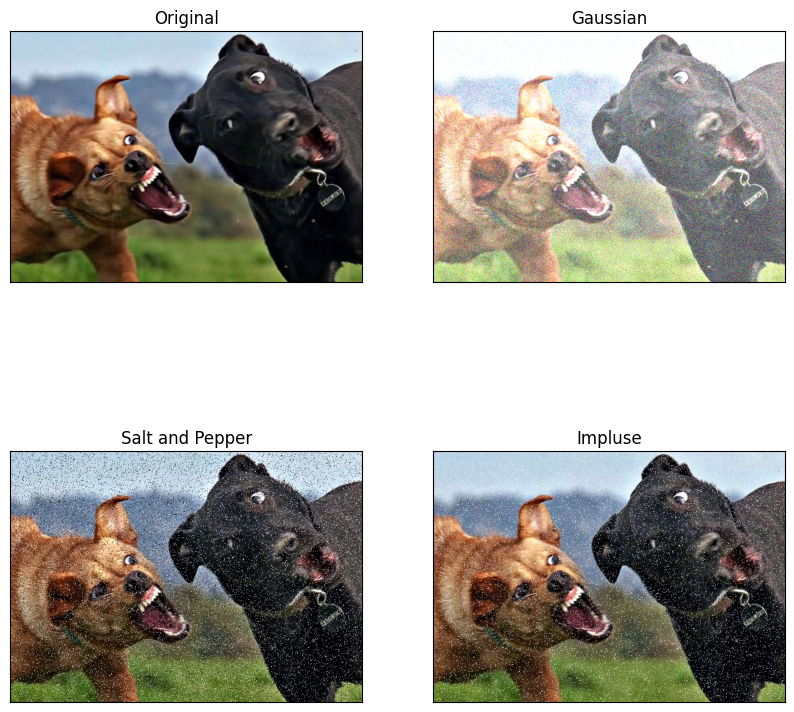

In [ ]:
import cv2
import numpy as np
import albumentations as albu


def add_gaussian_noise(image, mean, std=25):
  transform = albu.GaussNoise(var_limit=(1000,10000),mean=100,p=1)
  noisy_image = transform(image=image)['image']
  return noisy_image

def add_salt_and_pepper_noise(img, amount):
  thresh = amount
  numRows, numCols, _ = img.shape
  noise = np.random.rand(numRows,numCols)
  # Salt noise
  salt = noise < thresh
  img[salt] = 255
  # Pepper noise
  pepper = noise > 1 - thresh
  img[pepper] = 0
  return img

def add_impulse_noise(img, amount):
  # Generate random noise
  thresh = amount
  numRows, numCols, _ = img.shape
  noise = np.random.rand(numRows,numCols)
  # pepper noise
  im = noise < thresh
  img[im] = 255
  return img


image = np.array(img_list[1])
print(image.shape)
# Add Gaussian noise
gaussian_noisy_image = add_gaussian_noise(image, 0,0)

# Add salt and pepper noise
salt_pepper_noisy_image = add_salt_and_pepper_noise(np.copy(image), 0.05)  # Amount of noise: 0.05

# Add impulse noise
impulse_noisy_image = add_impulse_noise(np.copy(image), 0.05)  # Amount of noise: 0.05


plt.figure(figsize=(10, 10))
plt.subplot(221), plt.imshow(img_list[1]), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(gaussian_noisy_image), plt.title('Gaussian')
plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(salt_pepper_noisy_image), plt.title('Salt and Pepper')
plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(impulse_noisy_image), plt.title('Impluse')
plt.xticks([]), plt.yticks([])


plt.show()

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def show_result(blur_func):
    img = [gaussian_noisy_image, salt_pepper_noisy_image, impulse_noisy_image]
    img_names = ['Gaussian Noisy Image', 'Salt and Pepper Noisy Image', 'Impulse Noisy Image']

    plt.figure(figsize=(15, 5))
    for i in range(len(img)):
        plt.subplot(1, 3, i+1), plt.imshow(img[i], cmap='gray')
        plt.title(img_names[i])
        plt.xticks([]), plt.yticks([])
    plt.show()

    for i, noise_img in enumerate(img):
        plt.figure(figsize=(15, 5))
        for j, x in enumerate(range(3, 31, 8), start=1):
            dst = blur_func(noise_img, x)  # Apply the specified blur function
            plt.subplot(1, 4, j), plt.imshow(dst, cmap='gray')
            plt.title(f'Kernel Size: {x}') if x == 3 else plt.title(f'{x}')
            plt.xticks([]), plt.yticks([])
        plt.show()

## 1. Gaussian

1.1. Use cv2 GaussianBlur

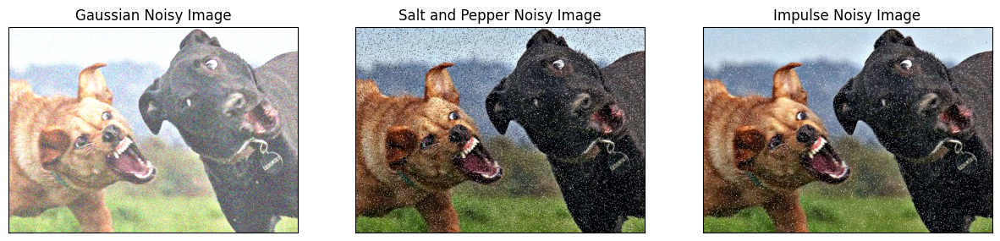

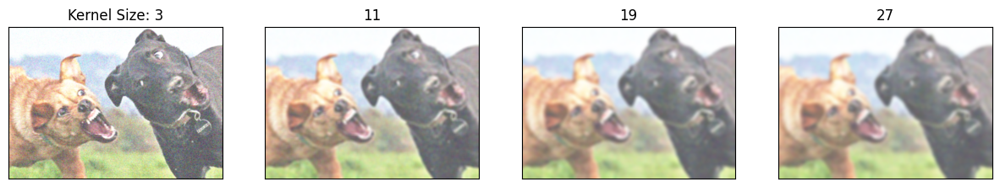

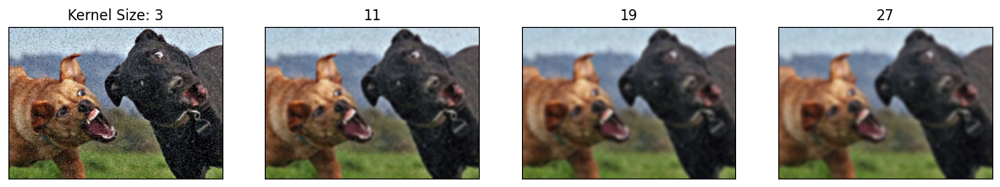

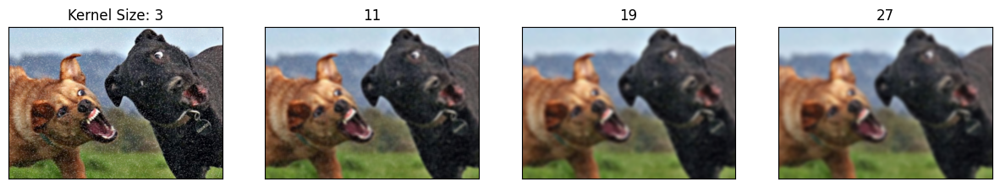

In [ ]:
def gaussian_blur(image, kernel_size):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 5)

# Example usage:
show_result(gaussian_blur)


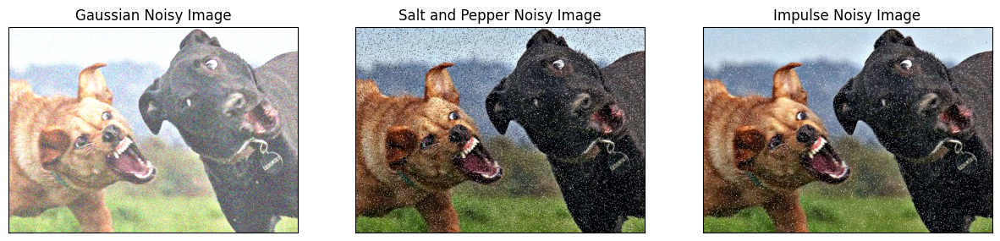

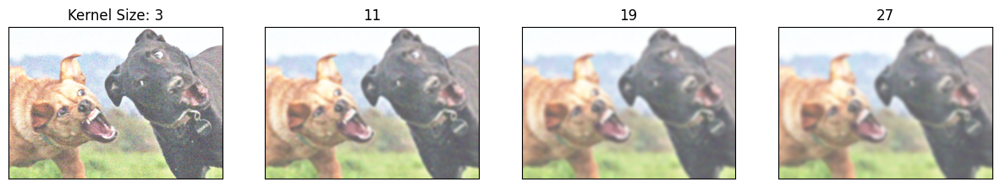

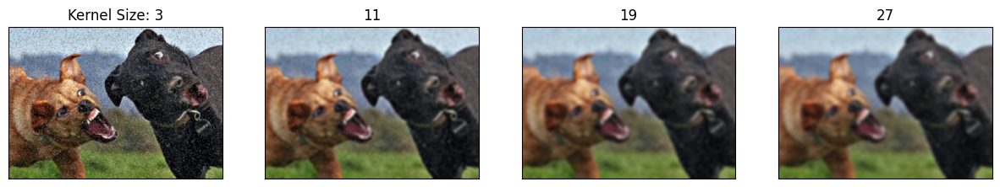

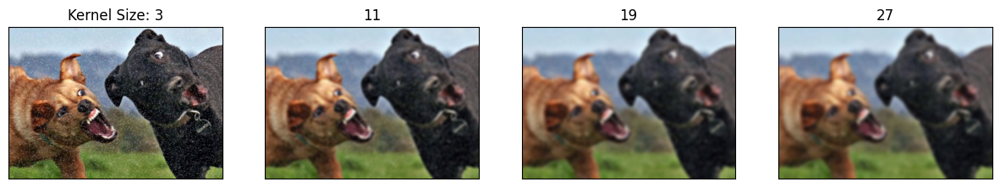

In [ ]:
def gau_build(image, kernel_size):
  k = cv2.getGaussianKernel(kernel_size,5)
  kernel_matrix = np.outer(k, k.transpose())
  des = cv2.filter2D(image, -1, kernel_matrix)
  return des
show_result(gau_build)

1.2. Build kernel gaussian

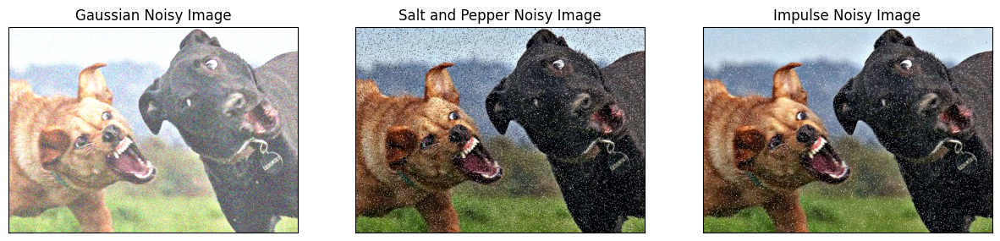

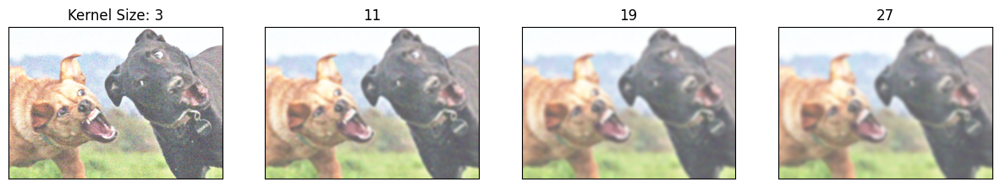

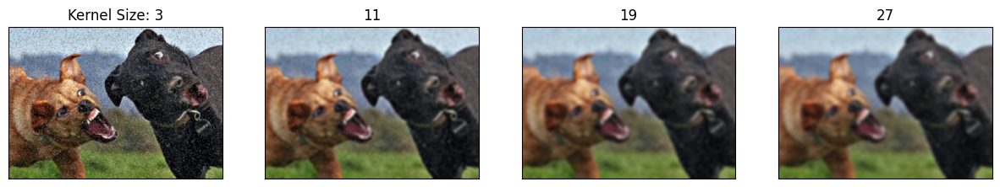

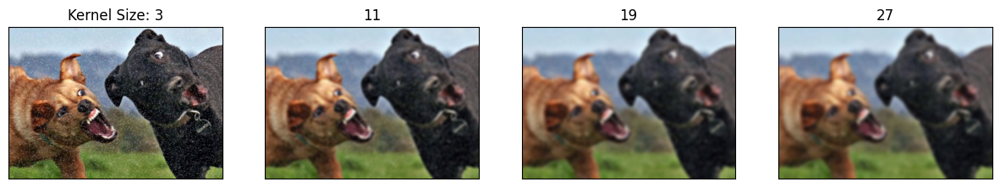

In [ ]:
import numpy as np

def gaussian_kernel(kernel_size, sigma):
    center = kernel_size // 2
    kernel_matrix = np.zeros((kernel_size, kernel_size))
    # Calculate the value for the kernel matrix
    for i in range(kernel_size):
        for j in range(kernel_size):
            x = i - center
            y = j - center
            kernel_matrix[i, j] = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    # Normalize the kernel
    kernel_matrix /= np.sum(kernel_matrix)
    return kernel_matrix

def gau_build(image, kernel_size):
    # Standard deviation of the Gaussian distribution
    sigma = 5
    kernel_matrix = gaussian_kernel(kernel_size, sigma)

    # Apply the custom Gaussian kernel using filter2D
    blurred_image = cv2.filter2D(image, -1, kernel_matrix)

    return blurred_image

show_result(gau_build)


In [ ]:
def show_result_one(blur_func, img):

    image = np.array(img)
    print(image.shape)
    # Add Gaussian noise
    gaussian_noisy_image = add_gaussian_noise(np.copy(image), 0,0)

    # Add salt and pepper noise
    salt_pepper_noisy_image = add_salt_and_pepper_noise(np.copy(image), 0.05)  # Amount of noise: 0.05

    # Add impulse noise
    impulse_noisy_image = add_impulse_noise(np.copy(image), 0.05)  # Amount of noise: 0.05

    img = [gaussian_noisy_image, salt_pepper_noisy_image, impulse_noisy_image]
    img_names = ['Gaussian Noisy Image', 'Salt and Pepper Noisy Image', 'Impulse Noisy Image']

    plt.figure(figsize=(15, 5))
    for i in range(len(img)):
        plt.subplot(1, 3, i+1), plt.imshow(img[i], cmap='gray')
        plt.title(img_names[i])
        plt.xticks([]), plt.yticks([])
    plt.show()

    plt.figure(figsize=(15, 5))
    for i, noise_img in enumerate(img):
        dst = blur_func(noise_img, 5)  # Apply the specified blur function
        plt.subplot(1, 3, i+1), plt.imshow(dst, cmap='gray')
        plt.xticks([]), plt.yticks([])
    plt.show()

1.3. Try with more images

(768, 1024, 3)


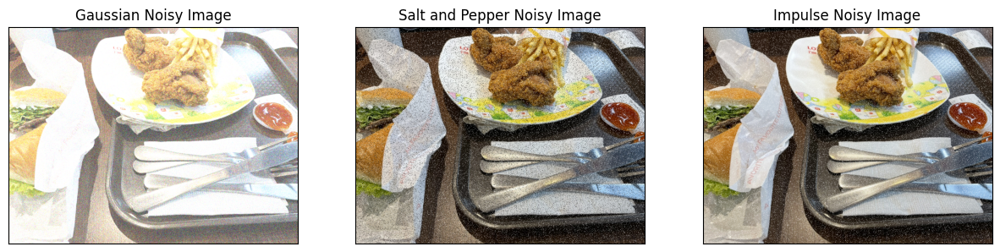

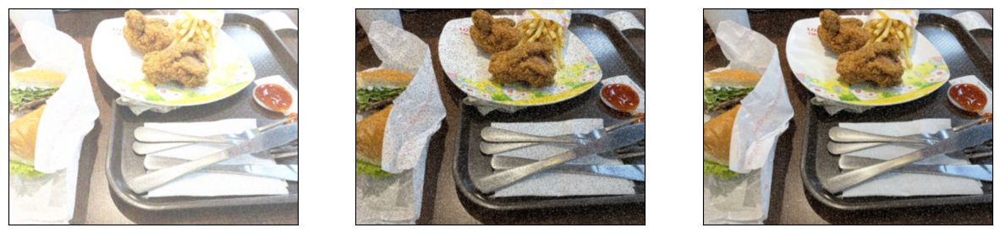

(483, 679, 3)


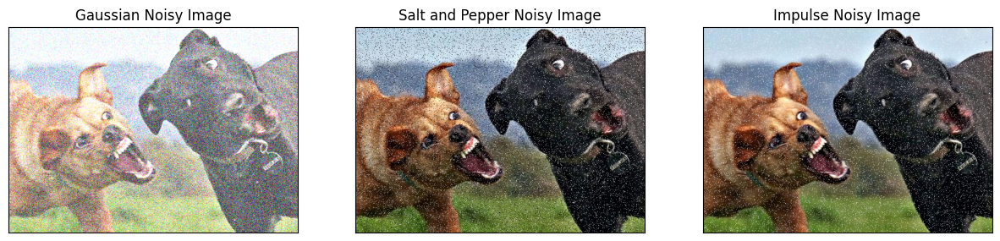

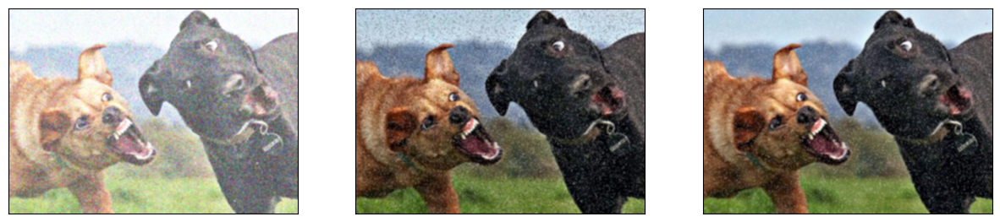

(622, 929, 3)


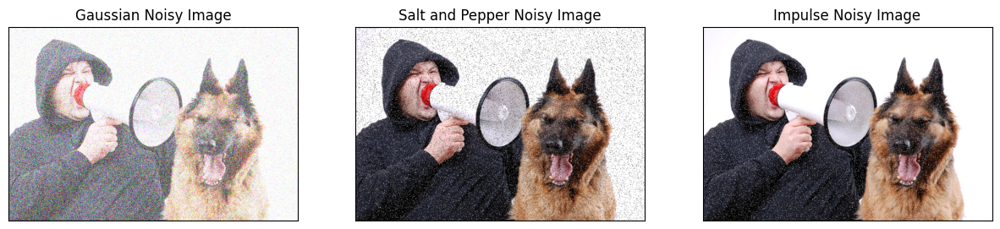

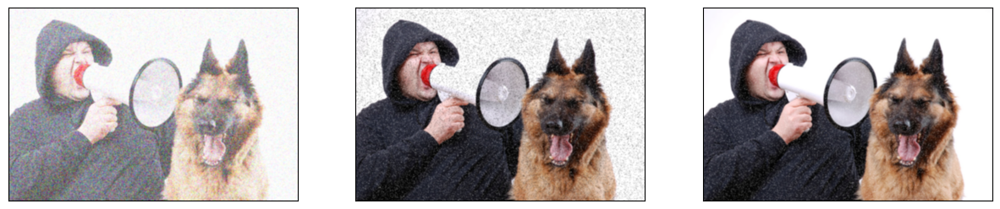

(949, 640, 3)


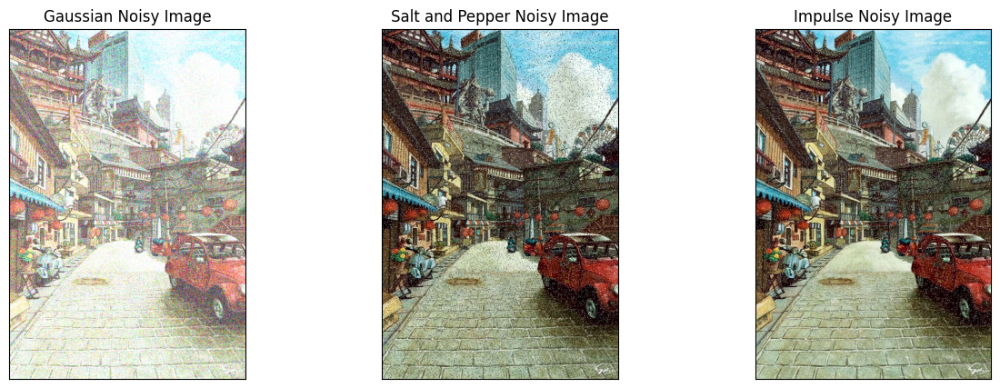

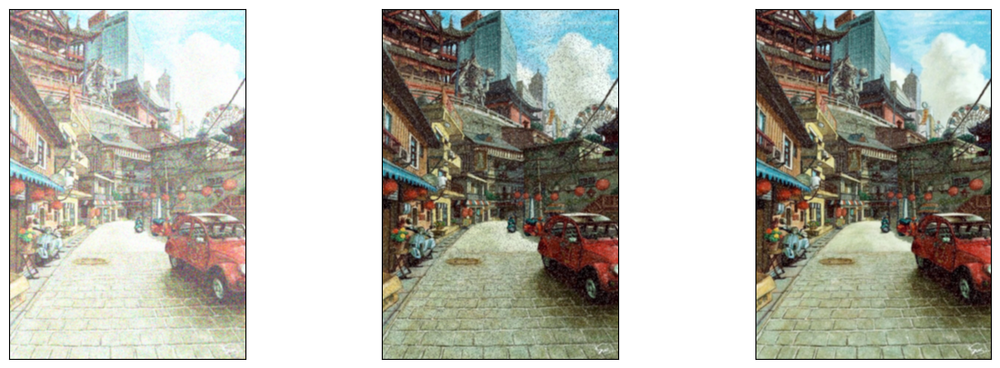

(750, 500, 3)


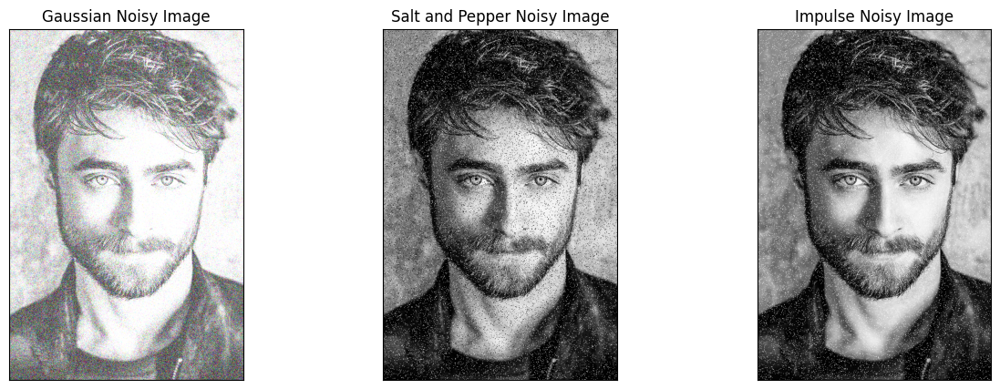

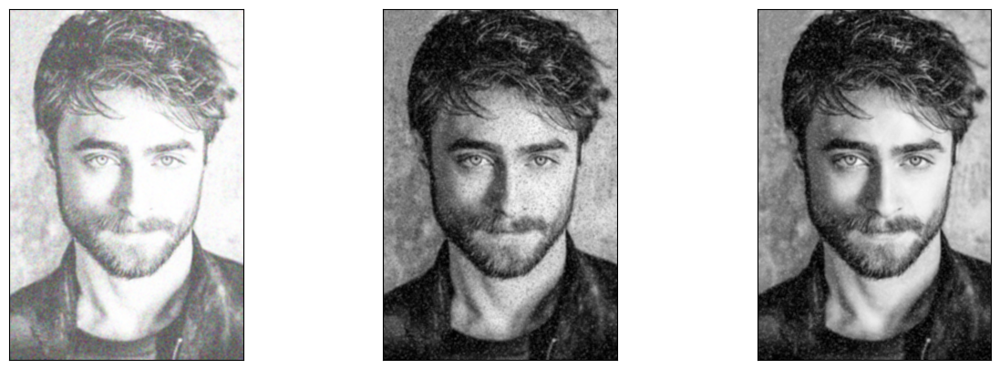

In [ ]:
for img in img_list:
  show_result_one(gaussian_blur,img)

## 2. MedianBlur

2.1. Build the median blur

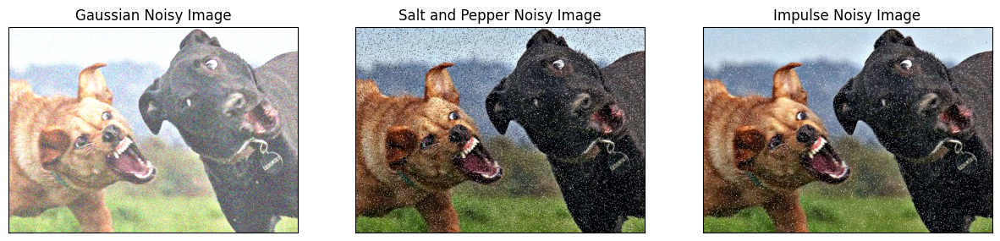

In [ ]:
def median_blur(image, kernel_size):
    # Calculate the padding size
    pad_size = kernel_size // 2

    # Pad the image
    padded_image = np.pad(image, pad_size, mode='edge')

    # Initialize the blurred image
    blurred_image = np.zeros_like(image)

    # Apply median blur
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            # Extract the kernel window
            window = padded_image[i:i+kernel_size, j:j+kernel_size]
            # Calculate the median value
            median_value = np.median(window)
            # Set the corresponding pixel in the blurred image
            blurred_image[i, j] = median_value

    return blurred_image
def median_blur_color(image, kernel_size):
  blurred_image = np.zeros_like(image)

  # Apply median blur to each color channel separately
  for i in range(image.shape[2]):
      blurred_image[:,:,i] = median_blur(image[:,:,i], kernel_size)
  return blurred_image
show_result(median_blur_color)

2.2. Use cv2 medianBlur

In [ ]:
def median_blur_color_cv2(image, kernel_size):
    blurred_image = cv2.medianBlur(image, kernel_size)
    return blurred_image

show_result(median_blur_color_cv2)

2.3. Try more images

In [ ]:
for img in img_list:
  show_result_one(median_blur_color_cv2,img)

## 3. Avarage blur

3.1. Build avarage blur

In [ ]:

def average_blur(image, kernel_size):
    # Calculate the padding size
    pad_size = kernel_size // 2

    # Pad the image
    padded_image = np.pad(image, pad_size, mode='edge')

    # Initialize the blurred image
    blurred_image = np.zeros_like(image)

    # Apply average blur
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            window = padded_image[i:i+kernel_size, j:j+kernel_size]
            average_value = np.mean(window)
            blurred_image[i, j] = average_value
    return blurred_image

def average_blur_color(image, kernel_size):
    # Initialize the blurred image
    blurred_image = np.zeros_like(image)

    # Apply average blur to each color channel separately
    for i in range(image.shape[2]):
        blurred_image[:,:,i] = average_blur(image[:,:,i], kernel_size)

    return blurred_image
show_result(average_blur_color)

3.2. Use cv2 blur

In [ ]:
def average_blur_color_cv2(image, kernel_size):
    blurred_image = cv2.blur(image, (kernel_size, kernel_size))

    return blurred_image
show_result(average_blur_color_cv2)

3.3. Try with more images

In [ ]:
for img in img_list:
  show_result_one(average_blur_color_cv2,img)

# High-pass filter


In [ ]:
image = np.array(img_list[1])

def show_result_high_pass(org, res, name):

  plt.subplot(223), plt.imshow(org), plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(224), plt.imshow(res, cmap='gray'), plt.title(name)
  plt.xticks([]), plt.yticks([])

  plt.show()

##1. Laplace


1.1. Use cv2 Laplacian

In [ ]:
import cv2

def laplacian_filter(image):
    # Convert the image to grayscale if it's in color
    if len(image.shape) == 3:
        grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        grayscale_image = image

    # Apply Laplacian filter using cv2.Laplacian()
    filtered_image = cv2.Laplacian(grayscale_image, cv2.CV_64F)

    # Convert the output back to uint8 and scale it to [0, 255]
    filtered_image = cv2.convertScaleAbs(filtered_image)
    return filtered_image

# Example usage:
image = np.array(img_list[1])
filtered_image = laplacian_filter(image)

show_result_high_pass(image, filtered_image, 'Laplacian')


1.2. Define kernel laplacian

In [ ]:
def laplacian_filter_build(image):
    # Define the Laplacian kernel
    laplacian_kernel = np.array([[0, -1, 0],
                                  [-1, 4, -1],
                                  [0, -1, 0]])
    # filtered_channels=[]
    # for channel in cv2.split(image):
    #     filtered_channel = cv2.filter2D(channel, -1, laplacian_kernel)
    #     filtered_channels.append(filtered_channel)
    filtered_channels = [cv2.filter2D(channel, -1, laplacian_kernel) for channel in cv2.split(image)]
    filtered_image = cv2.merge(filtered_channels)
    return filtered_image
image = np.array(img_list[1])
filtered_image = laplacian_filter_build(image)

show_result_high_pass(image, filtered_image, 'Laplacian')

1.3 Try with more images

In [ ]:
for img in img_list:
  image = np.array(img)
  filtered_image = laplacian_filter(image)
  show_result_high_pass(image, filtered_image, 'Laplacian')

## 2. Sobel


2.1. Build sobel kernel

In [ ]:
import cv2
import numpy as np

def sobel_filter(image):
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])

    sobel_y = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]])

    # Apply Sobel filter to compute gradient magnitudes in horizontal and vertical directions
    gradient_x = cv2.filter2D(image, -1, sobel_x)
    gradient_y = cv2.filter2D(image, -1, sobel_y)

    # Compute the gradient magnitude
    gradient_magnitude = np.sqrt(np.square(gradient_x) + np.square(gradient_y))
    gradient_magnitude = gradient_magnitude.astype(np.float32)
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

    return filtered_image


image = np.array(img_list[1])
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Sobel filter to the grayscale image
filtered_image = sobel_filter(gray_image)

# plt.subplot(223), plt.imshow(img_list[1]), plt.title('Salt and Pepper')
# plt.xticks([]), plt.yticks([])
# plt.subplot(224), plt.imshow(filtered_image), plt.title('filtered image')
# plt.xticks([]), plt.yticks([])


# plt.show()

show_result_high_pass(image, filtered_image, 'Sobel')

2.2. Use cv2 sobel

In [ ]:
def sobel_filter_cv2(image):
    if image is None or image.size == 0:
        raise ValueError("Input image is empty or invalid.")

    if len(image.shape) != 2:
        raise ValueError("Input image must be grayscale.")

    # Apply Sobel filter to compute gradient magnitudes in horizontal and vertical directions
    gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

    # Compute the gradient magnitude
    gradient_magnitude = cv2.magnitude(gradient_x, gradient_y)

    # Normalize the gradient magnitude to [0, 255]
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Convert the data type to uint8
    filtered_image = np.uint8(gradient_magnitude)

    return filtered_image

# Convert the image to grayscale if it's in color
image = np.array(img_list[1])
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Apply Sobel filter to the grayscale image
filtered_image = sobel_filter_cv2(gray_image)

show_result_high_pass(image, filtered_image, 'Sobel')


2.3 Try with more images

In [ ]:
#try with more image
for img in img_list:
  image = np.array(img)
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  filtered_image = sobel_filter_cv2(gray_image)
  show_result_high_pass(image, filtered_image, 'Sobel')

## 3. Canny edge detector

3.1. Use cv2 Canny

In [ ]:
def canny_edge_detector_cv2(image, min_threshold, max_threshold):
    edges = cv2.Canny(image, min_threshold, max_threshold)
    return edges

gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Define the threshold values for Canny edge detector
min_threshold = 100
max_threshold = 200

# Apply Canny edge detector to the grayscale image
filtered_image = canny_edge_detector_cv2(gray_image, min_threshold, max_threshold)

show_result_high_pass(image, filtered_image, 'Canny')


3.2. Build canny though theory

In [ ]:
def canny_edge_detector(image, min_threshold, max_threshold):
    # Apply Gaussian blur to the image to reduce noise
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

    # Compute gradients using the Sobel operator
    gradient_x = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=3)

    # Compute gradient magnitude and direction
    gradient_magnitude = cv2.magnitude(gradient_x, gradient_y)
    gradient_direction = cv2.phase(gradient_x, gradient_y)

    # Perform non-maximum suppression to thin edges
    gradient_magnitude_suppressed = cv2.dilate(cv2.erode(gradient_magnitude, None), None)

    # Apply double thresholding to identify potential edges
    edges = np.zeros_like(gradient_magnitude_suppressed)
    edges[(gradient_magnitude_suppressed >= min_threshold) & (gradient_magnitude_suppressed <= max_threshold)] = 255

    return edges

# Read the input image
image = np.array(img_list[1])
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


# Define the threshold values for Canny edge detector
min_threshold = 100
max_threshold = 200
filtered_image = canny_edge_detector(gray_image, min_threshold, max_threshold)


# Apply Canny edge detector to the grayscale image
show_result_high_pass(image, filtered_image, 'Canny')

In [ ]:
# Try more
for img in img_list:
  image = np.array(img)
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  filtered_image = canny_edge_detector_cv2(gray_image, min_threshold, max_threshold)
  show_result_high_pass(image, filtered_image, "Canny")